### Brain state trajectories over time (sliding-window wSMI, k-means)

This section visualizes the temporal evolution of the $K$ brain states learned from wSMI-based connectivity features.

- The stacked dataset `k3_tau8ms_vec_stack.npz` provides per-window feature vectors $X \in \mathbb{R}^{N \times P}$ together with subject indices and per-window event labels.
- The file `state_labels_k5.npy` stores the k-means state assignments $z_t \in \{0, \dots, K-1\}$ for each sliding window $t$ (here $K = 5$).
- Sliding windows are constructed with length $L = 16\,\mathrm{s}$ and stride $s = 1\,\mathrm{s}$, so the center time of window $t$ is
  $t_{\text{center}}(t) = \frac{L}{2} + t \cdot s$.
- For a chosen subject, the code extracts the contiguous block of windows belonging to that subject, builds the corresponding time axis, and plots the state labels $z_t$ as a function of time.
- Shaded background regions indicate selected event labels (for example “Resting”, “Familiar voice”, “Medical staff”), based on the per-window `event_labels_all` metadata. Colored points represent the assigned brain states.


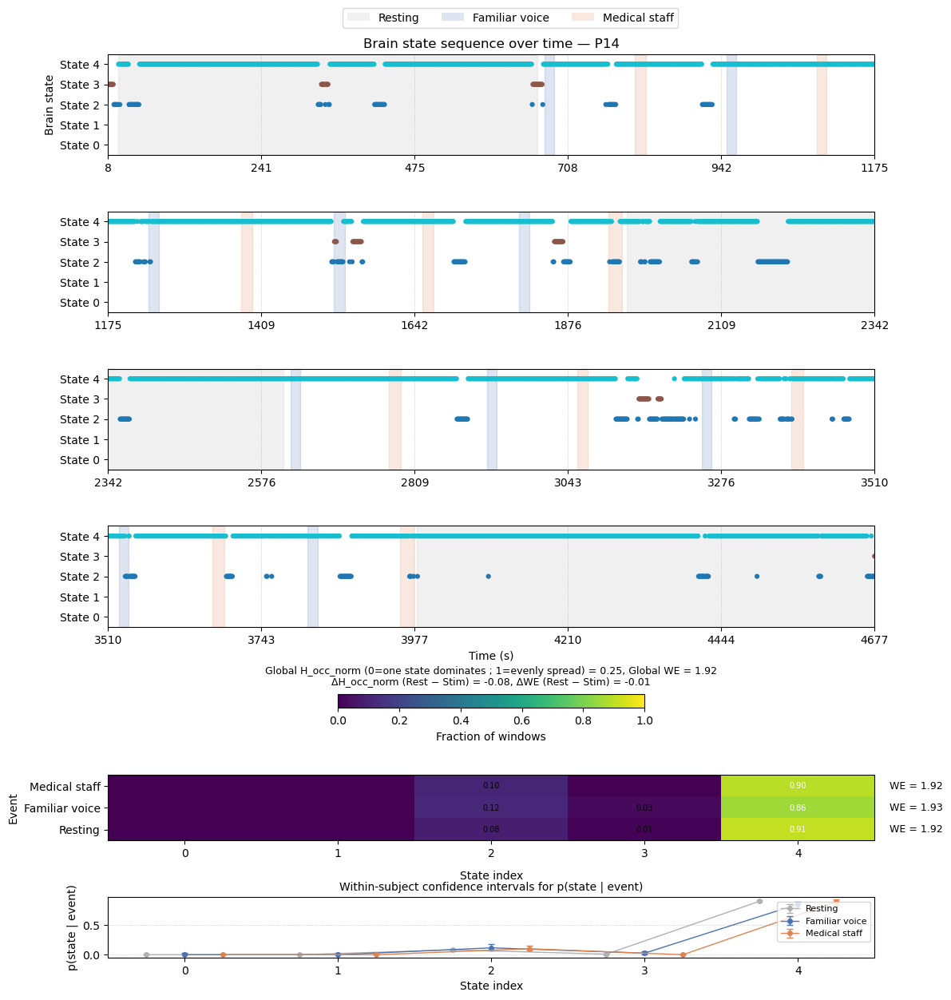

In [ ]:
from pathlib import Path  # path handling across platforms
from typing import Iterable, Dict, Tuple, List  # Type hints for clarity

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch  # For custom legend entries
from mpl_toolkits.axes_grid1.inset_locator import inset_axes  # For compact colorbar placement


# -------------------------------------------------------------------
# Configuration
# -------------------------------------------------------------------

# Base directory for the sliding-window wSMI dataset
base_dir = Path(
    "../data/processed/wsmi/sliding_window16s_stride1s/sliding_window16s_stride1s_nice_csd"
)  # Root of the sliding-window pipeline outputs

# Paths to the stacked feature matrix and the per-window state labels
stack_path = base_dir / "k3_tau8ms_vec_stack.npz"  # Contains X, subjects, event_labels_all, etc.
labels_path = base_dir / "k3_tau8ms" / "kmeans_assigned_states" / "state_labels_k5.npy"  # Contains z_t for all windows

# Path to state entropies H_i
state_entropy_path = (
    base_dir / "k3_tau8ms" / "kmeans_assigned_states" / "state_entropies_k5.npy"
)  # Contains H_i for each state i

# Sliding-window parameters used during epoching
WINDOW_LENGTH_S = 16.0  # Window length L in seconds
STRIDE_S = 1.0  # Stride s in seconds between consecutive windows

# Event labels to highlight with background shading (others remain unshaded)
highlight_events = [
    "Resting",
    "Familiar voice",
    "Medical staff",
]  # Can be edited depending on the analysis focus

# Colors for event shading (Ioannis-style interpretation of stimulus blocks)
event_colors = {
    "Resting": "#B0B0B0",        # Light grey for resting periods
    "Familiar voice": "#4C72B0",  # Blue for familiar voice
    "Medical staff": "#DD8452",   # Orange/yellow for medical staff
}

# Subject identifier to visualize (must match entries in the 'subjects' array)
subject_id = "P14"  # Example subject; can be changed

# Number of temporal panels for the brain state sequence
N_PANELS = 4  # Split the time axis into this many parts


# -------------------------------------------------------------------
# Utility: load data
# -------------------------------------------------------------------

# Load stacked dataset with allow_pickle=False for safety
stack_npz = np.load(stack_path, allow_pickle=False)  # Provides dict-like access to stored arrays

# Load global state labels for all windows (shape (N,))
state_labels_all = np.load(labels_path)  # Global sequence of k-means assignments

# Basic sanity check to ensure alignment between features and labels
N_from_stack = int(stack_npz["N"])  # Total number of windows stored in the stack
if state_labels_all.shape[0] != N_from_stack:  # Verify that lengths match
    raise RuntimeError(
        f"Mismatch between stacked windows (N={N_from_stack}) and labels (N={state_labels_all.shape[0]})."
    )

# Infer total number of states K from the global labels
N_STATES = int(state_labels_all.max() + 1)  # Assumes labels are 0, ..., K-1

# Load state entropies H_i (one value per state)
H_VEC = np.load(state_entropy_path).astype(float)  # Shape (K,)
if H_VEC.shape[0] != N_STATES:  # Guard against inconsistent shapes
    raise RuntimeError(
        f"Expected {N_STATES} state entropies, got {H_VEC.shape[0]}."
    )


# -------------------------------------------------------------------
# Helper: Wilson confidence interval for binomial proportion
# -------------------------------------------------------------------

def wilson_interval(k: int, n: int, alpha: float = 0.05) -> Tuple[float, float]:
    """
    Compute the (1 - alpha) Wilson confidence interval for a binomial proportion.

    Parameters
    ----------
    k : int
        Number of "successes" (e.g., windows assigned to a given state).
    n : int
        Total number of trials (e.g., all windows for a given event).
    alpha : float
        Significance level (default 0.05 for 95% CI).

    Returns
    -------
    (low, high) : tuple of float
        Lower and upper bounds of the Wilson interval. Returns (nan, nan) if n == 0.
    """
    if n == 0:
        return np.nan, np.nan  # Undefined interval if there are no trials

    # Critical z-value for two-sided normal approximation; z ~ 1.96 for 95% CI
    z = 1.96
    p_hat = k / n

    denom = 1.0 + (z**2) / n
    center = (p_hat + (z**2) / (2.0 * n)) / denom
    half_width = z * np.sqrt(
        (p_hat * (1.0 - p_hat) / n) + (z**2) / (4.0 * n * n)
    ) / denom

    return center - half_width, center + half_width


# -------------------------------------------------------------------
# Plotting function
# -------------------------------------------------------------------

def plot_brain_states_over_time(
    subject: str,
    *,
    stack: np.lib.npyio.NpzFile,
    labels: np.ndarray,
    window_length_s: float,
    stride_s: float,
    events_to_highlight: Iterable[str],
    event_color_map: Dict[str, str],
    n_states: int,
    H_vec: np.ndarray,
    n_panels: int = 4,
) -> Tuple[plt.Figure, Tuple[List[plt.Axes], plt.Axes, plt.Axes]]:
    """
    Plot brain state labels over time for a single subject using sliding-window k-means results.

    Layout:
    - Top: n_panels temporal panels with absolute time in seconds on the x-axis.
    - Middle: per-event heatmap of normalized state fractions p_i and annotated WE.
    - Below heatmap: compact horizontal colorbar + global and delta metrics text.
    - Bottom: per-event Wilson confidence intervals for p(state | event) in the same subject.
    """
    subjects = stack["subjects"]         # Array of subject IDs
    file_ptr = stack["file_ptr"]         # Cumulative window offsets per subject
    event_labels_all = stack["event_labels_all"]  # Per-window event label strings

    events_list = list(events_to_highlight)  # Fix order as list for consistent indexing

    # Locate subject index in the subjects array
    matches = np.where(subjects == subject)[0]  # All indices matching subject ID
    if matches.size == 0:  # Guard against invalid subject IDs
        available = ", ".join(subjects.tolist())
        raise ValueError(f"Subject '{subject}' not found. Available subjects: {available}")
    subj_idx = int(matches[0])  # Use the first match

    # Determine the global window index range for this subject
    start_idx = int(file_ptr[subj_idx])      # First window index for this subject (inclusive)
    stop_idx = int(file_ptr[subj_idx + 1])   # One-past-last window index (exclusive)

    # Extract subject-specific slices for labels and events
    subj_states = labels[start_idx:stop_idx]         # State labels z_t for this subject
    subj_events = event_labels_all[start_idx:stop_idx]  # Event labels for each window

    # ------------------------------------------------------------------
    # Global occupancy distribution and entropies for this subject
    # ------------------------------------------------------------------
    state_counts_global = np.bincount(subj_states, minlength=n_states)  # Count windows per state
    p_global = state_counts_global.astype(float)
    if p_global.sum() == 0.0:  # Guard against empty subjects
        raise RuntimeError("Global state counts sum to zero for this subject.")
    p_global /= p_global.sum()  # Convert counts to probabilities p_i^(all)

    nonzero_mask_global = p_global > 0.0  # Avoid log(0) in entropy
    H_occ = -np.sum(p_global[nonzero_mask_global] * np.log(p_global[nonzero_mask_global]))  # Unnormalized entropy

    if n_states > 1:
        H_occ_norm = H_occ / np.log(n_states)  # Normalized occupancy entropy in [0, 1]
    else:
        H_occ_norm = 0.0  # Degenerate case with only one state

    WE_global = float((p_global * H_vec).sum())  # Global WE = sum_i p_i^(all) * H_i

    # ------------------------------------------------------------------
    # Rest vs stimuli entropies (occupancy and WE)
    # ------------------------------------------------------------------
    rest_event_name = "Resting"  # Name used to identify rest windows
    rest_mask = np.asarray(subj_events == rest_event_name, dtype=bool)  # True for Resting windows

    # Stimuli are defined as all windows that are not Resting
    stim_mask = ~rest_mask  # Logical negation of rest_mask

    H_occ_norm_rest = np.nan
    H_occ_norm_stim = np.nan
    WE_rest = np.nan
    WE_stim = np.nan
    delta_H_occ_norm = np.nan
    delta_WE = np.nan

    # Compute occupancy entropy and WE for Resting, if present
    if rest_mask.any():
        states_rest = subj_states[rest_mask]
        counts_rest = np.bincount(states_rest, minlength=n_states)
        p_rest = counts_rest.astype(float)
        if p_rest.sum() > 0.0:
            p_rest /= p_rest.sum()
            nonzero_rest = p_rest > 0.0
            H_occ_rest = -np.sum(p_rest[nonzero_rest] * np.log(p_rest[nonzero_rest]))
            if n_states > 1:
                H_occ_norm_rest = H_occ_rest / np.log(n_states)
            else:
                H_occ_norm_rest = 0.0
            WE_rest = float((p_rest * H_vec).sum())

    # Compute occupancy entropy and WE for stimuli, if present
    if stim_mask.any():
        states_stim = subj_states[stim_mask]
        counts_stim = np.bincount(states_stim, minlength=n_states)
        p_stim = counts_stim.astype(float)
        if p_stim.sum() > 0.0:
            p_stim /= p_stim.sum()
            nonzero_stim = p_stim > 0.0
            H_occ_stim = -np.sum(p_stim[nonzero_stim] * np.log(p_stim[nonzero_stim]))
            if n_states > 1:
                H_occ_norm_stim = H_occ_stim / np.log(n_states)
            else:
                H_occ_norm_stim = 0.0
            WE_stim = float((p_stim * H_vec).sum())

    # Compute delta-H_occ_norm and delta-WE if both conditions are defined
    if np.isfinite(H_occ_norm_rest) and np.isfinite(H_occ_norm_stim):
        delta_H_occ_norm = H_occ_norm_rest - H_occ_norm_stim  # Rest − Stimuli
    if np.isfinite(WE_rest) and np.isfinite(WE_stim):
        delta_WE = WE_rest - WE_stim  # Rest − Stimuli

    # ------------------------------------------------------------------
    # Time axis in seconds (window centers)
    # ------------------------------------------------------------------
    n_windows = subj_states.shape[0]  # Number of windows
    centers = window_length_s / 2.0 + stride_s * np.arange(n_windows, dtype=float)  # t_center(t) = L/2 + t * s

    # Split total time into n_panels equal spans
    t_min = float(centers.min())
    t_max = float(centers.max())
    total_span = t_max - t_min
    panel_span = total_span / float(n_panels)

    panel_limits: List[Tuple[float, float]] = []
    for i in range(n_panels):
        t0 = t_min + i * panel_span
        t1 = t_min + (i + 1) * panel_span if i < n_panels - 1 else t_max
        panel_limits.append((t0, t1))

    # Precompute event segments in time for shading
    segments_per_event: Dict[str, List[Tuple[float, float]]] = {}
    for event_name in events_list:
        color = event_color_map.get(event_name, None)
        if color is None:
            segments_per_event[event_name] = []
            continue

        mask = np.asarray(subj_events == event_name, dtype=bool)
        if not mask.any():
            segments_per_event[event_name] = []
            continue

        in_segment = False
        seg_start_idx = 0
        segments_idx: List[Tuple[int, int]] = []
        for i, is_active in enumerate(mask):
            if is_active and not in_segment:
                in_segment = True
                seg_start_idx = i
            elif not is_active and in_segment:
                in_segment = False
                segments_idx.append((seg_start_idx, i - 1))
        if in_segment:
            segments_idx.append((seg_start_idx, n_windows - 1))

        segments_time: List[Tuple[float, float]] = []
        for seg_start, seg_end in segments_idx:
            t0_seg = centers[seg_start] - stride_s / 2.0
            t1_seg = centers[seg_end] + stride_s / 2.0
            segments_time.append((t0_seg, t1_seg))

        segments_per_event[event_name] = segments_time

    # ------------------------------------------------------------------
    # Figure and axes: n_panels for time + 1 for colorbar + 1 for heatmap + 1 for CI panel
    # ------------------------------------------------------------------
    fig = plt.figure(figsize=(12, 13))  # Slightly taller for extra CI panel
    gs = fig.add_gridspec(
        n_panels + 3,
        1,
        height_ratios=[2] * n_panels + [0.7, 1.3, 1.2],
        hspace=0.7,
    )

    ax_main_list: List[plt.Axes] = []
    for i in range(n_panels):
        ax = fig.add_subplot(gs[i, 0])
        ax_main_list.append(ax)

    ax_cb = fig.add_subplot(gs[-3, 0])  # Dedicated row for the colorbar + text
    ax_hm = fig.add_subplot(gs[-2, 0])  # Heatmap row
    ax_ci = fig.add_subplot(gs[-1, 0])  # CI row

    # ------------------------------------------------------------------
    # Temporal panels (brain state sequence)
    # ------------------------------------------------------------------
    for panel_idx, ax in enumerate(ax_main_list):
        # Shaded event blocks for this panel
        for event_name in events_list:
            color = event_color_map.get(event_name, None)
            if color is None:
                continue
            for t0_seg, t1_seg in segments_per_event.get(event_name, []):
                ax.axvspan(
                    t0_seg,
                    t1_seg,
                    color=color,
                    alpha=0.18,
                    zorder=0,
                )

        # Scatter plot of state index vs. time
        ax.scatter(
            centers,
            subj_states,
            c=subj_states,
            s=20,
            cmap="tab10",
            edgecolors="none",
            zorder=2,
        )

        # Y-axis (state indices)
        all_states = np.arange(n_states)
        ax.set_yticks(all_states)
        ax.set_yticklabels([f"State {int(s)}" for s in all_states])
        ax.set_ylim(-0.5, n_states - 0.5)

        # X-axis (time) for this panel
        t0_panel, t1_panel = panel_limits[panel_idx]
        ax.set_xlim(t0_panel, t1_panel)

        tick_positions = np.linspace(t0_panel, t1_panel, 6)
        ax.set_xticks(tick_positions)
        ax.set_xticklabels([f"{tp:.0f}" for tp in tick_positions])

        if panel_idx == n_panels - 1:
            ax.set_xlabel("Time (s)")
        else:
            ax.set_xlabel("")

        if panel_idx == 0:
            ax.set_ylabel("Brain state")
            ax.set_title(f"Brain state sequence over time — {subject}")
        else:
            ax.set_ylabel("")

        ax.grid(True, axis="x", linestyle=":", linewidth=0.5)

    # ------------------------------------------------------------------
    # Legend for event shading
    # ------------------------------------------------------------------
    legend_handles = [
        Patch(facecolor=event_color_map[e], alpha=0.18, label=e)
        for e in events_list
        if event_color_map.get(e) is not None
    ]
    fig.legend(
        handles=legend_handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.98),
        ncol=len(legend_handles),
        frameon=True,
    )

    # ------------------------------------------------------------------
    # Heatmap: p_i and WE per event
    # ------------------------------------------------------------------
    n_events = len(events_list)
    heatmap_data = np.zeros((n_events, n_states), dtype=float)
    counts_event = np.zeros((n_events, n_states), dtype=int)  # Raw counts per event and state
    WE_per_event = np.full(n_events, np.nan, dtype=float)

    for row_idx, event_name in enumerate(events_list):
        mask_event = np.asarray(subj_events == event_name, dtype=bool)
        if not mask_event.any():
            continue

        states_in_event = subj_states[mask_event]

        # Count how many windows in this event fall into each state
        for state_idx in range(n_states):
            c = int(np.sum(states_in_event == state_idx))
            counts_event[row_idx, state_idx] = c
            heatmap_data[row_idx, state_idx] = float(c)

        row_sum = heatmap_data[row_idx].sum()
        if row_sum > 0.0:
            heatmap_data[row_idx] /= row_sum
            WE_per_event[row_idx] = float((heatmap_data[row_idx] * H_vec).sum())

    im = ax_hm.imshow(
        heatmap_data,
        aspect="auto",
        origin="lower",
        vmin=0.0,
        vmax=1.0,
        cmap="viridis",
    )

    all_states = np.arange(n_states)
    ax_hm.set_xticks(all_states)
    ax_hm.set_xticklabels([f"{int(s)}" for s in all_states])
    ax_hm.set_yticks(np.arange(n_events))
    ax_hm.set_yticklabels(events_list)

    ax_hm.set_xlabel("State index", labelpad=10.0)
    ax_hm.set_ylabel("Event")

    # Annotate p_i values in each cell
    for i in range(n_events):
        for j in range(n_states):
            v = heatmap_data[i, j]
            if v <= 0.0:
                continue
            text_color = "white" if v > 0.5 else "black"
            ax_hm.text(
                j,
                i,
                f"{v:.2f}",
                ha="center",
                va="center",
                fontsize=7,
                color=text_color,
            )

    # WE per event to the right of the heatmap
    for row_idx, event_name in enumerate(events_list):
        we_val = WE_per_event[row_idx]
        if not np.isfinite(we_val):
            continue
        y_pos = (row_idx + 0.5) / n_events
        ax_hm.text(
            1.02,
            y_pos,
            f"WE = {we_val:.2f}",
            transform=ax_hm.transAxes,
            ha="left",
            va="center",
            fontsize=9,
        )

    # ------------------------------------------------------------------
    # Colorbar row + global and delta metrics text
    # ------------------------------------------------------------------
    ax_cb.set_axis_off()  # Hide underlying axis frame

    cax = inset_axes(
        ax_cb,
        width="40%",   # 40% of width of colorbar row
        height="40%",  # 40% of height of colorbar row
        loc="center",
        borderpad=0.0,
    )  # Inset axis for the actual colorbar

    cbar = fig.colorbar(im, cax=cax, orientation="horizontal")
    cbar.set_label("Fraction of windows")

    # Global metrics text (for the whole subject)
    ax_cb.text(
        0.5,
        1.2,
        f"Global H_occ_norm (0=one state dominates ; 1=evenly spread) = {H_occ_norm:.2f}, Global WE = {WE_global:.2f}",
        transform=ax_cb.transAxes,
        ha="center",
        va="bottom",
        fontsize=9,
    )

    # Delta metrics text (Rest − Stimuli), only if defined
    delta_text_parts = []
    if np.isfinite(delta_H_occ_norm):
        delta_text_parts.append(f"ΔH_occ_norm (Rest − Stim) = {delta_H_occ_norm:.2f}")
    if np.isfinite(delta_WE):
        delta_text_parts.append(f"ΔWE (Rest − Stim) = {delta_WE:.2f}")
    if delta_text_parts:
        ax_cb.text(
            0.5,
            0.9,
            ", ".join(delta_text_parts),
            transform=ax_cb.transAxes,
            ha="center",
            va="bottom",
            fontsize=9,
        )

    # ------------------------------------------------------------------
    # Bottom panel: Wilson confidence intervals for p(state | event)
    # ------------------------------------------------------------------
    ax_ci.set_title("Within-subject confidence intervals for p(state | event)", fontsize=10)

    # Pre-compute Wilson intervals for each event/state (for a binomial proportion)
    ci_low = np.full((n_events, n_states), np.nan, dtype=float)
    ci_high = np.full((n_events, n_states), np.nan, dtype=float)

    for row_idx in range(n_events):
        # Total number of windows for this event
        n_total = int(counts_event[row_idx].sum())
        if n_total == 0:
            continue

        for state_idx in range(n_states):
            k = int(counts_event[row_idx, state_idx])
            low, high = wilson_interval(k, n_total, alpha=0.05)
            ci_low[row_idx, state_idx] = low
            ci_high[row_idx, state_idx] = high

    # Plot as grouped points with error bars for each event
    x_base = np.arange(n_states, dtype=float)
    # Horizontal offsets so events do not overlap exactly
    if n_events > 1:
        offsets = np.linspace(-0.25, 0.25, n_events)
    else:
        offsets = np.array([0.0])

    for row_idx, event_name in enumerate(events_list):
        n_total = int(counts_event[row_idx].sum())
        if n_total == 0:
            continue

        p_row = heatmap_data[row_idx]  # Central estimates p(state | event)
        low_row = ci_low[row_idx]
        high_row = ci_high[row_idx]

        # Skip events with undefined CIs
        if not np.any(np.isfinite(low_row)) or not np.any(np.isfinite(high_row)):
            continue

        # Asymmetric error bars relative to the central estimate p
        lower_err = p_row - low_row
        upper_err = high_row - p_row

        # Replace any negative values (from numerical issues) with 0
        lower_err = np.clip(lower_err, 0.0, None)
        upper_err = np.clip(upper_err, 0.0, None)

        x = x_base + offsets[row_idx]
        color = event_color_map.get(event_name, None)

        ax_ci.errorbar(
            x,
            p_row,
            yerr=[lower_err, upper_err],
            fmt="o-",
            capsize=3.0,
            linewidth=1.0,
            markersize=4.0,
            label=event_name,
            color=color,
        )

    ax_ci.set_xlim(-0.5, n_states - 0.5)
    ax_ci.set_xticks(np.arange(n_states))
    ax_ci.set_xticklabels([f"{int(s)}" for s in range(n_states)])
    ax_ci.set_xlabel("State index")
    ax_ci.set_ylabel("p(state | event)")
    ax_ci.grid(True, axis="y", linestyle=":", linewidth=0.5)

    # Place legend for CI panel
    ax_ci.legend(loc="upper right", frameon=True, fontsize=8)

    # Layout adjustment
    fig.subplots_adjust(
        left=0.08,
        right=0.88,
        bottom=0.06,
        top=0.93,
        hspace=0.7,
    )

    return fig, (ax_main_list, ax_hm, ax_ci)


# -------------------------------------------------------------------
# Run the visualization for the configured subject
# -------------------------------------------------------------------

fig, (ax_main_list, ax_hm, ax_ci) = plot_brain_states_over_time(
    subject=subject_id,
    stack=stack_npz,
    labels=state_labels_all,
    window_length_s=WINDOW_LENGTH_S,
    stride_s=STRIDE_S,
    events_to_highlight=highlight_events,
    event_color_map=event_colors,
    n_states=N_STATES,
    H_vec=H_VEC,
    n_panels=N_PANELS,
)

plt.show()


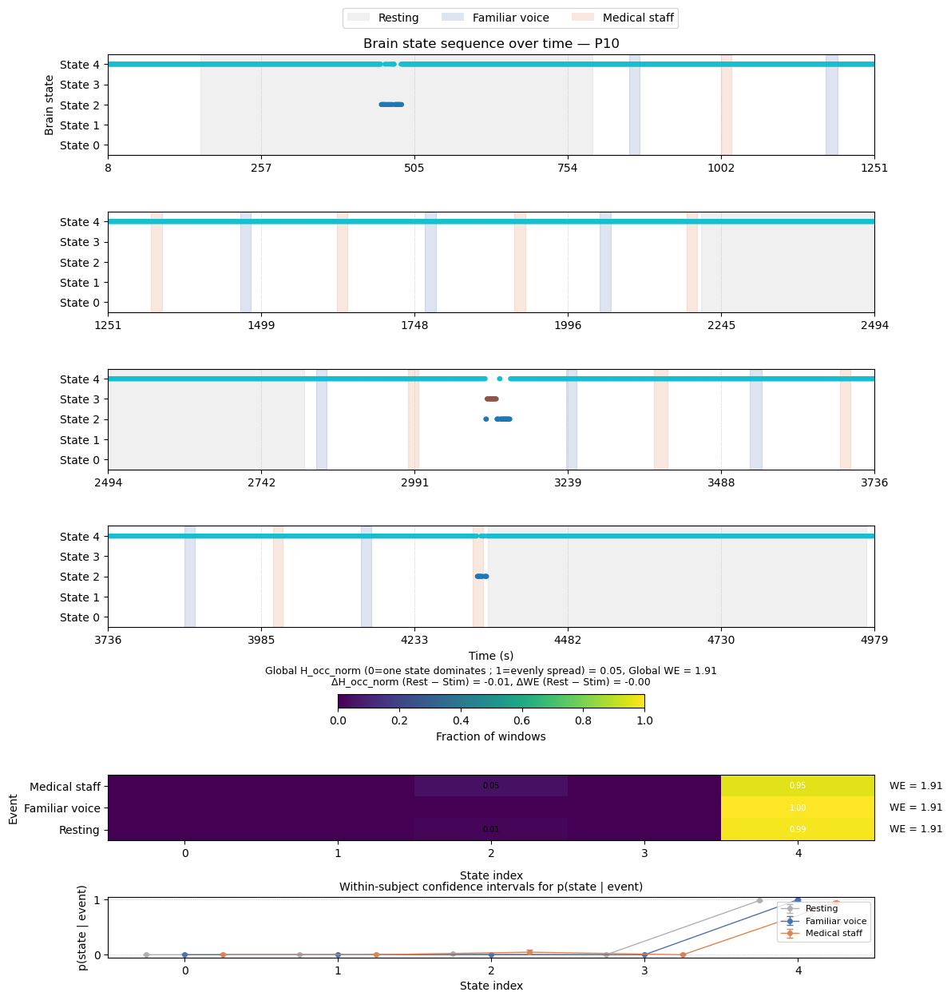

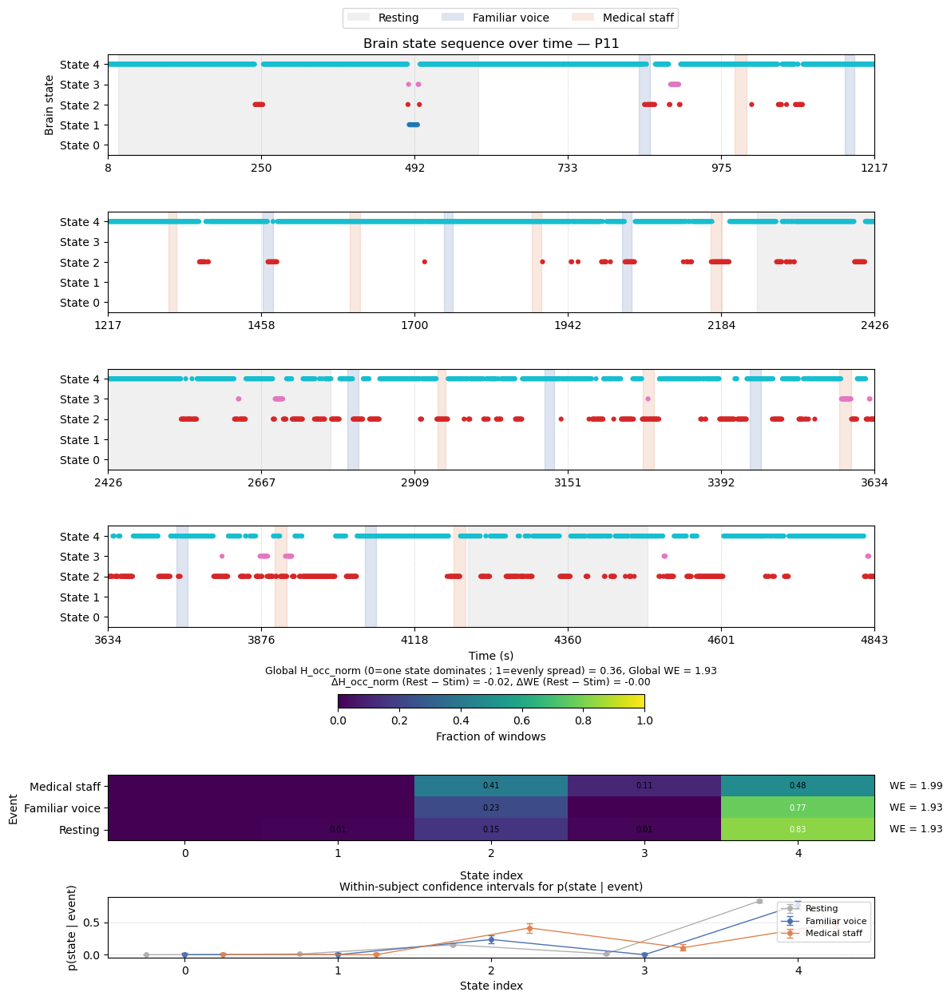

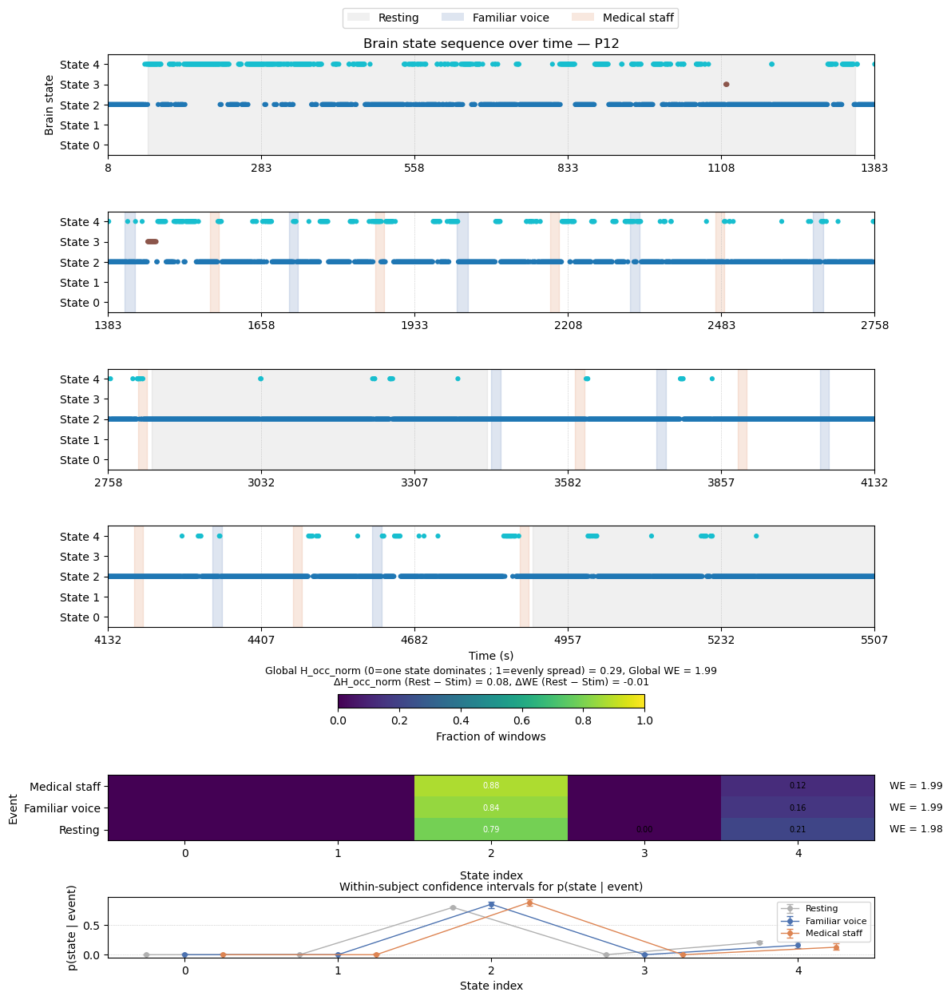

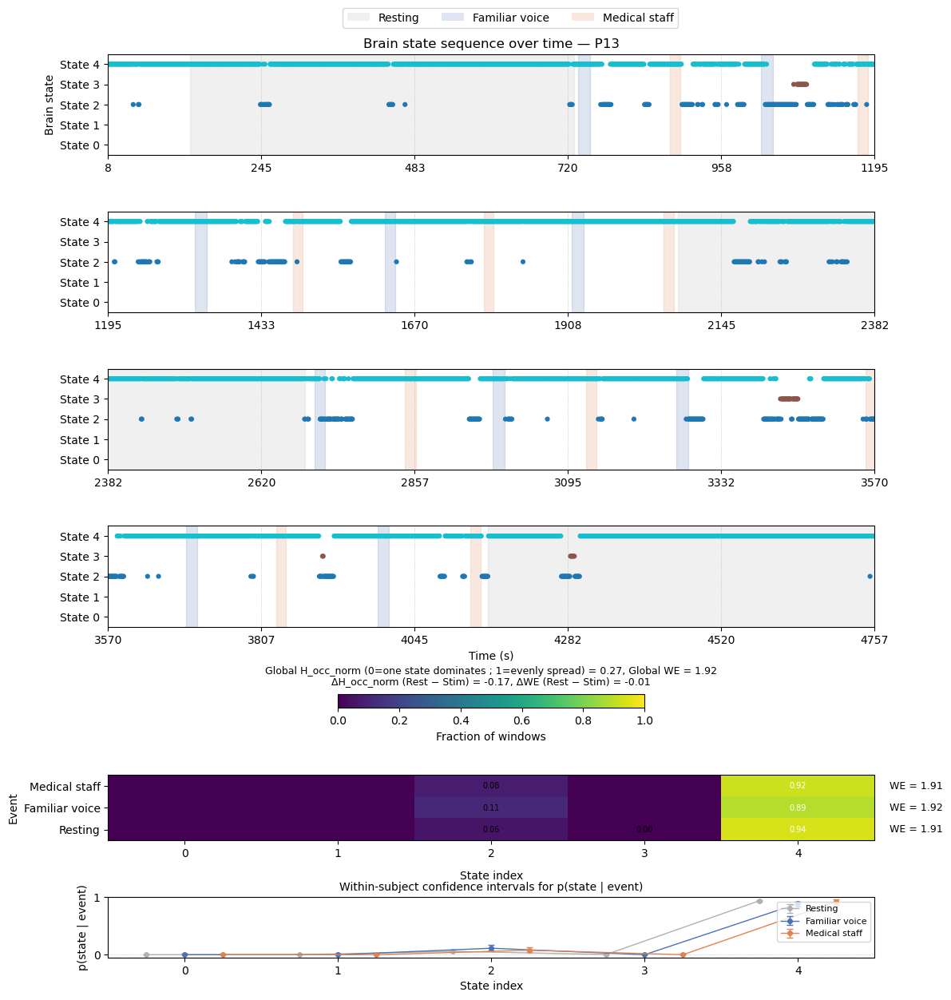

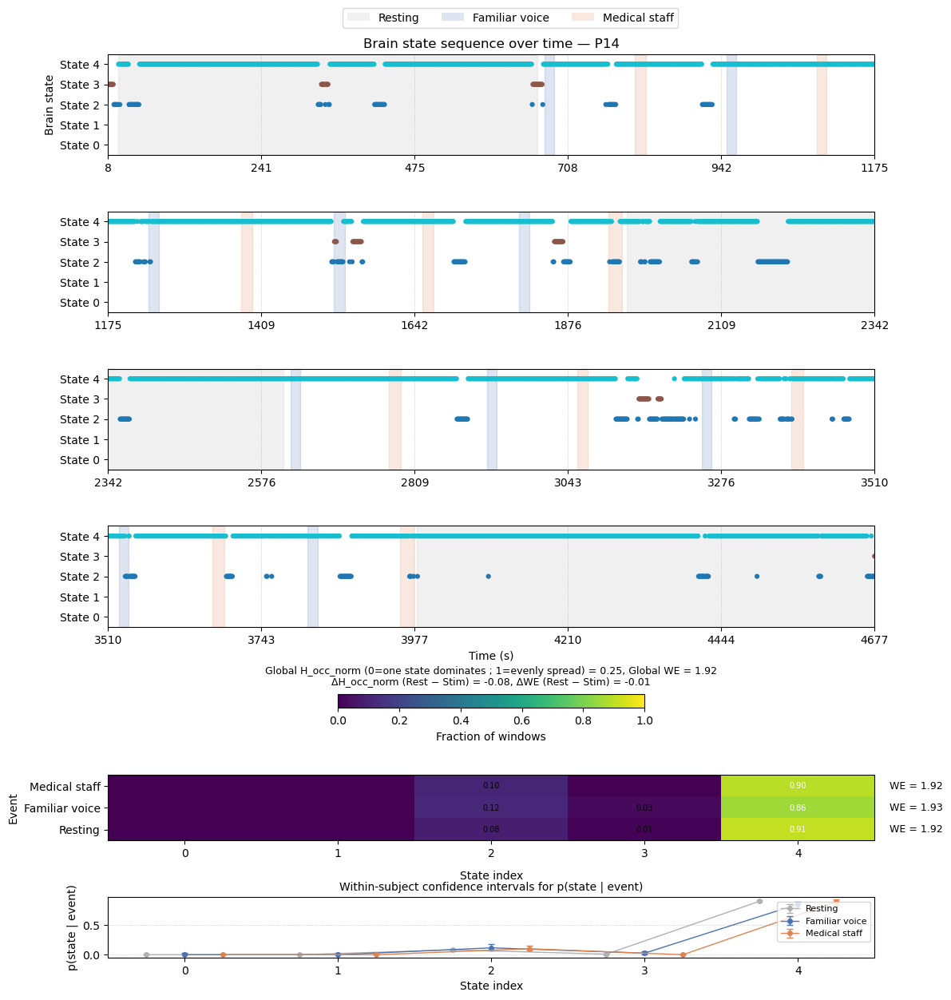

...

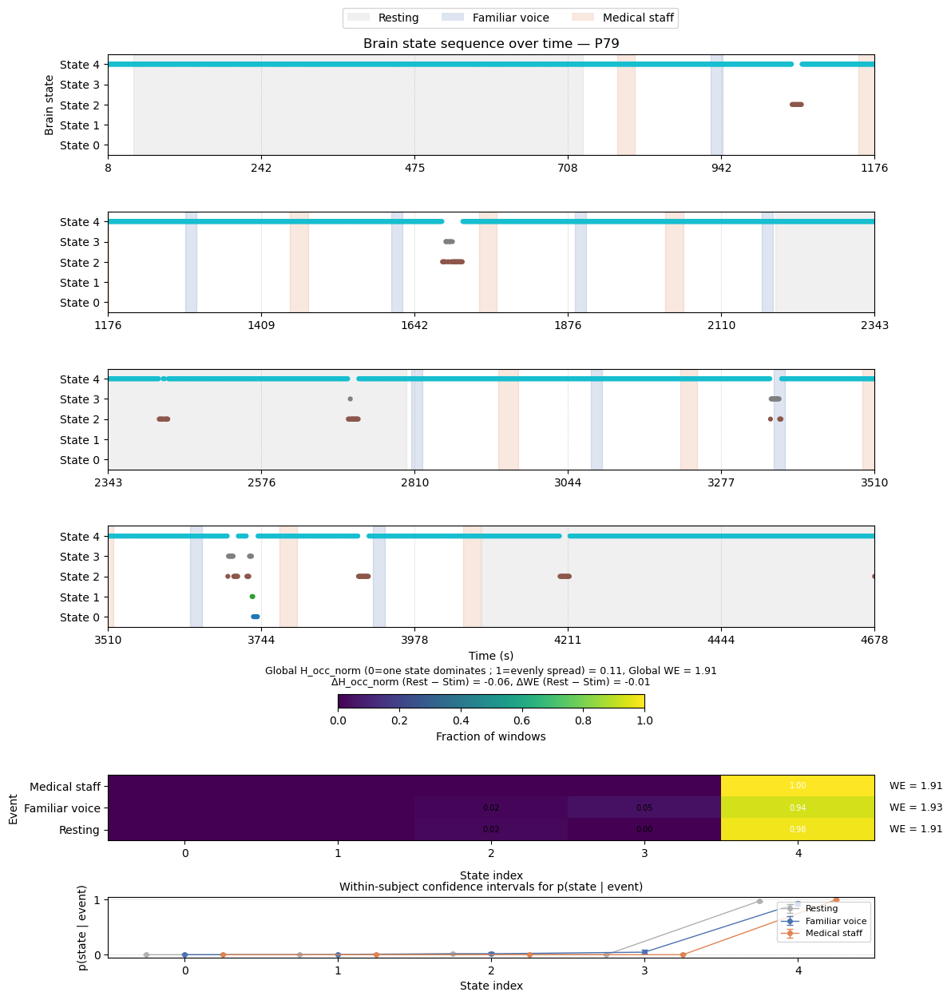

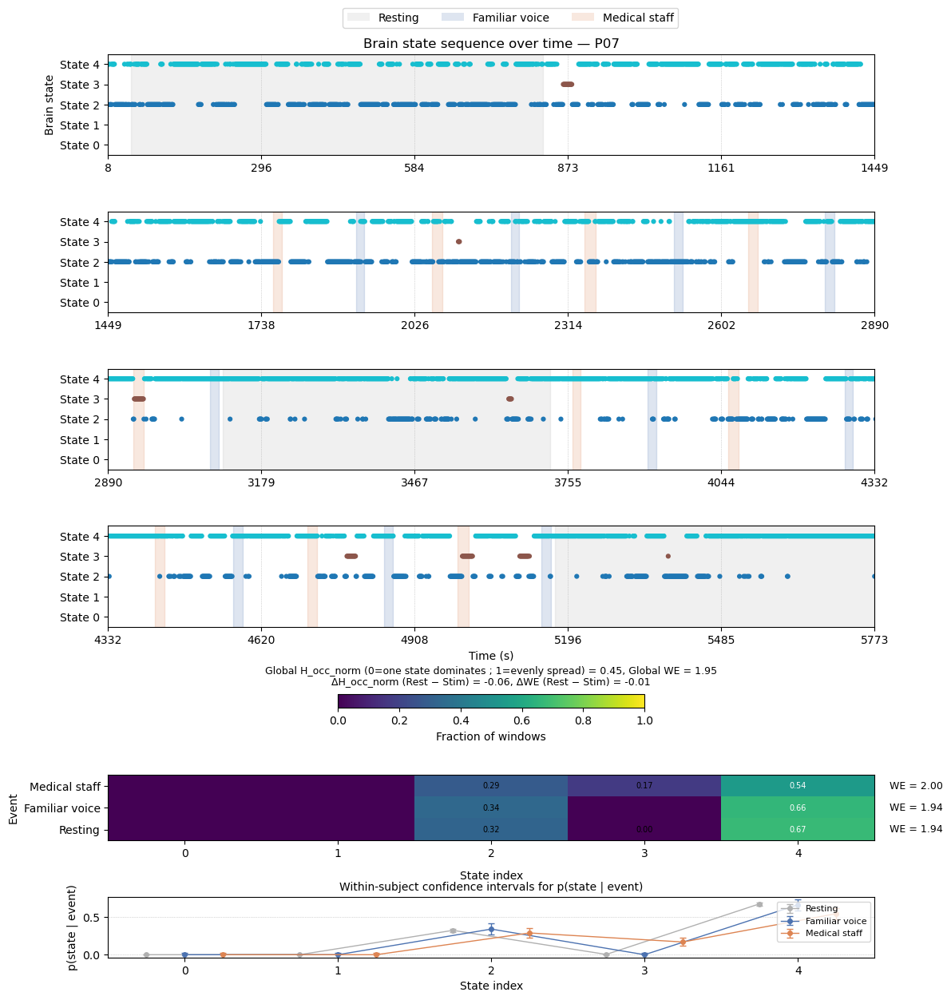

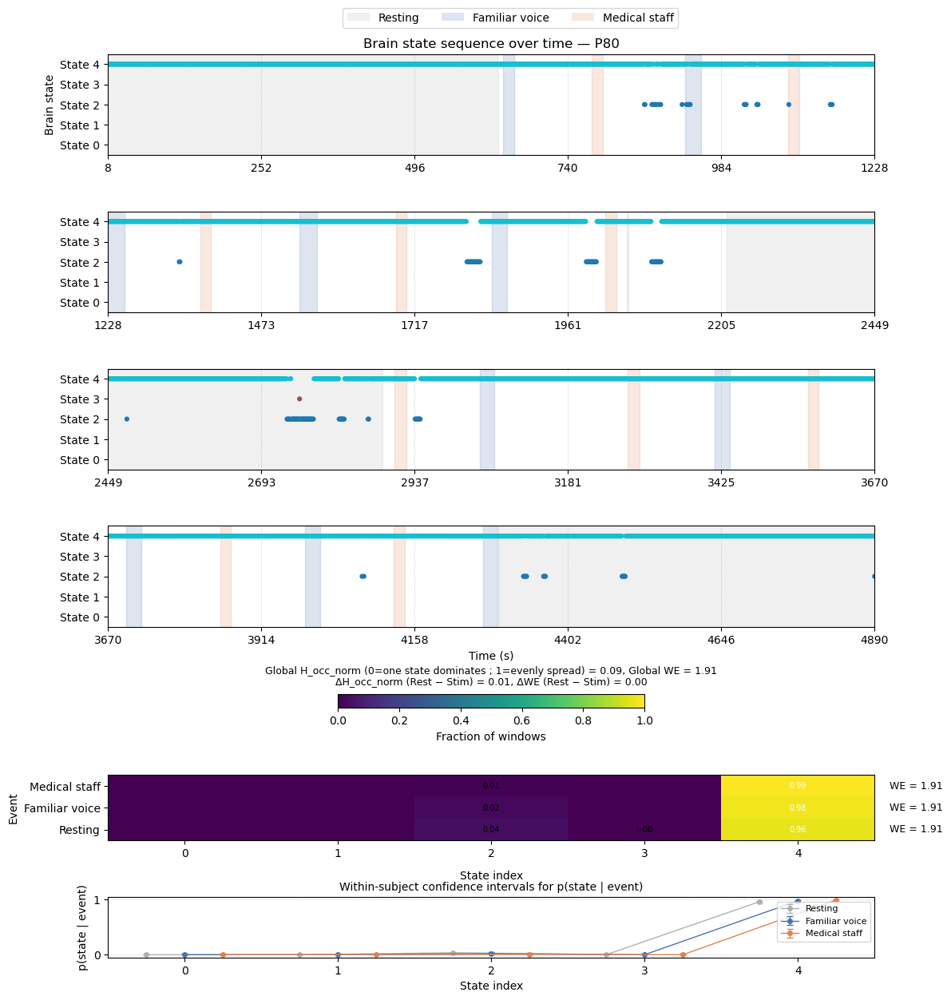

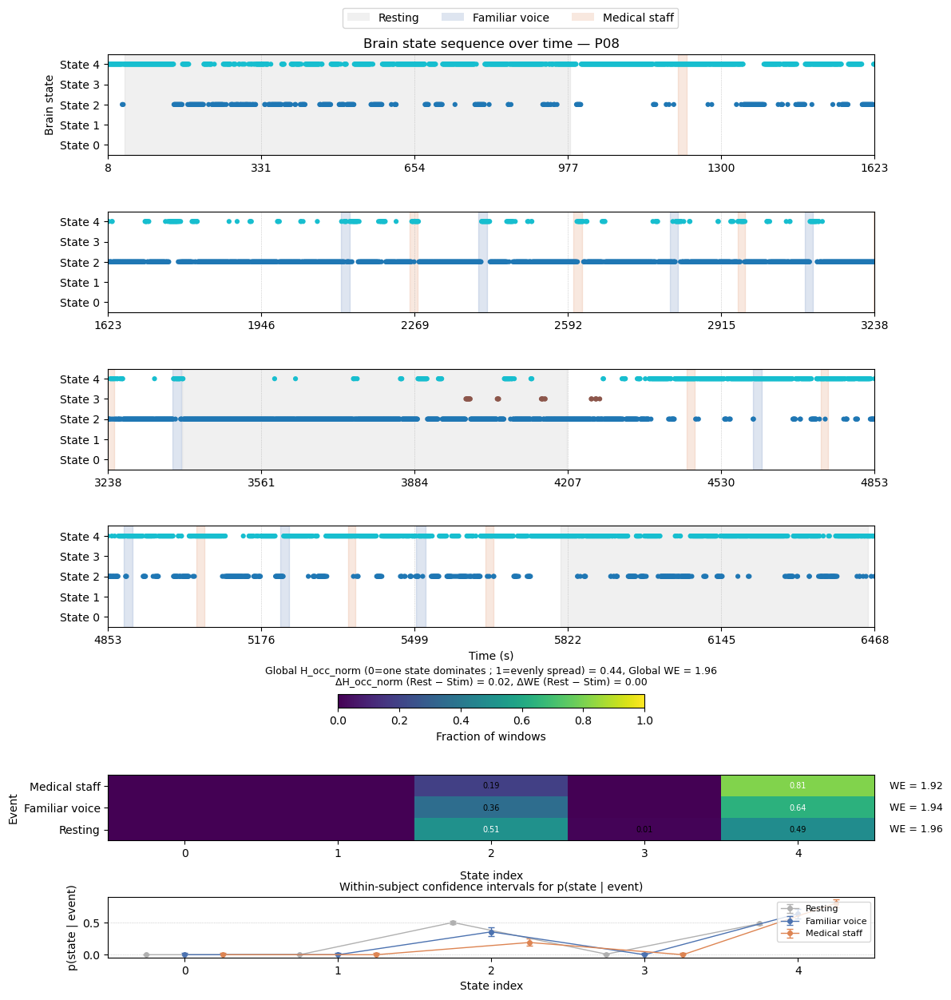

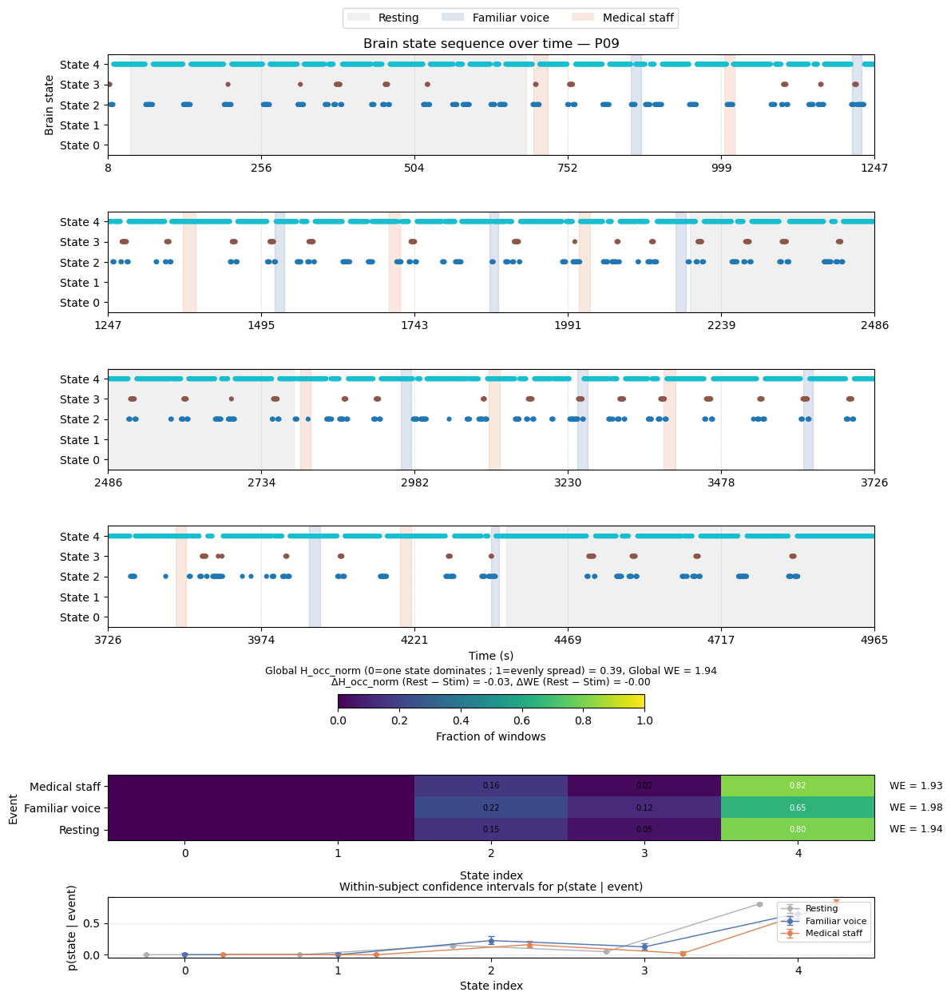

In [ ]:
# -------------------------------------------------------------------
# Generate plots for all subjects in the stacked dataset
# -------------------------------------------------------------------

# Output directory for the exported figures
output_dir = Path("../plots/07_brain_states_sliding_window16s_stride1s")  # Relative to this notebook
output_dir.mkdir(parents=True, exist_ok=True)  # Create directory if it does not exist

# Loop over all subjects and produce one figure per subject
for subj in stack_npz["subjects"]:
    subj_id = str(subj)  # Ensure subject ID is a clean string

    # Create the figure for this subject
    fig, _ = plot_brain_states_over_time(
        subject=subj_id,                  # Current subject ID
        stack=stack_npz,                  # Loaded stacked dataset
        labels=state_labels_all,          # Global state labels for all windows
        window_length_s=WINDOW_LENGTH_S,  # Sliding-window length L
        stride_s=STRIDE_S,                # Sliding-window stride s
        events_to_highlight=highlight_events,
        event_color_map=event_colors,
        n_states=N_STATES,
        H_vec=H_VEC,
        n_panels=N_PANELS,
    )

    # Show the figure in the notebook (one below the other)
    plt.show()  # Renders the figure output for this subject

    # Save a high-resolution PNG for later use
    out_path = output_dir / f"{subj_id}_brain_states_sliding_window16s_stride1s.png"
    fig.savefig(out_path, dpi=300, bbox_inches="tight")  # Save figure to disk

    plt.close(fig)  # Close figure to free memory before moving to next subject